# House Rocket

## Introduction

### Summary

House Rocket is a digital platform whose business model is to buy and sell real estate using technology. </br>
Their main strategy is to buy good homes in great locations at low prices and then resell them later at higher prices. The greater the difference between buying and selling, the greater the company's profit and therefore the greater its revenue. </br>
However, homes have many attributes that make them more or less attractive to buyers and sellers, and location and time of year can also influence prices. </br>
The dataset used contains house sold between May 2014 and May 2015 for King County, which includes Seattle (USA). It is available on kaggle and can be downloaded from this [link](https://www.kaggle.com/harlfoxem/housesalesprediction).

### Dataset columns definition

- id - Unique ID for each home sold
- date - Date of the home sale
- price - Price of each home sold
- bedrooms - Number of bedrooms
- bathrooms - Number of bathrooms, where 0.5 accounts for a room with a toilet but no shower
- sqft_living - Square footage of the apartments interior living space
- sqft_lot - Square footage of the land space
- floors - Number of floors
- waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
- view - An index from 0 to 4 of how good the view of the property was
- condition - An index from 1 to 5 on the condition of the apartment,
- grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
- sqft_above - The square footage of the interior housing space that is above ground level
- sqft_basement - The square footage of the interior housing space that is below ground level
- yr_built - The year the house was initially built
- yr_renovated - The year of the house’s last renovation
- zipcode - What zipcode area the house is in
- lat - Lattitude
- long - Longitude
- sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
- sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

### Business problem

The business team cannot make good purchasing decisions without analyzing the data. </br>
The portfolio is very large and takes a long time to analyze manually.

The main objective of this project is to find the best property purchase opportunities in the House Rocket portfolio. For this, 2 questions must be answered:
- **Which houses should House Rocket buy and at what purchase price?**
- **Once the house is purchased, what would the sale price be?**

## Libraries

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import seaborn as sns
import plotly.express as px

## Data Extraction

In [2]:
# load dataset
data = pd.read_csv( 'house_rocket_app/dataset/kc_house_data.csv' )

In [3]:
# data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [4]:
# convert object to date
data['date'] = pd.to_datetime( data['date'], format='%Y-%m-%d' )
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Data Transformation

### Checking nulls and dupicate values

In [5]:
#check for null values
data.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

There are no nulls

In [6]:
#check to see if 'id' is unique identifier for each sample
data['id'].duplicated().sum()

177

In [7]:
# analyzing a specific id
data[data['id'].duplicated(keep=False)].sort_values(by=['id', 'date'], ascending=True).iloc[:, :18].head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat
2496,1000102,2014-09-16,280000.0,6,3.00,2400,9373,2.0,0,0,3,7,2400,0,1991,0,98002,47.3262
2497,1000102,2015-04-22,300000.0,6,3.00,2400,9373,2.0,0,0,3,7,2400,0,1991,0,98002,47.3262
16814,7200179,2014-10-16,150000.0,2,1.00,840,12750,1.0,0,0,3,6,840,0,1925,0,98055,47.4840
16815,7200179,2015-04-24,175000.0,2,1.00,840,12750,1.0,0,0,3,6,840,0,1925,0,98055,47.4840
11433,109200390,2014-08-20,245000.0,3,1.75,1480,3900,1.0,0,0,4,7,1480,0,1980,0,98023,47.2977
11434,109200390,2014-10-20,250000.0,3,1.75,1480,3900,1.0,0,0,4,7,1480,0,1980,0,98023,47.2977
12417,123039336,2014-06-11,148000.0,1,1.00,620,8261,1.0,0,0,3,5,620,0,1939,0,98106,47.5138
12418,123039336,2014-12-08,244900.0,1,1.00,620,8261,1.0,0,0,3,5,620,0,1939,0,98106,47.5138
7792,251300110,2014-07-31,225000.0,3,2.25,2510,12013,2.0,0,0,3,8,2510,0,1988,0,98003,47.3473
7793,251300110,2015-01-14,358000.0,3,2.25,2510,12013,2.0,0,0,3,8,2510,0,1988,0,98003,47.3473


Duplicates ids refer to homes that were sold more than once on different dates. </br> Let`s keep only the latest sales.

In [8]:
#drop duplicates and only keep the most current data
data = data.sort_values('id', ascending = False).drop_duplicates(subset = 'id', keep = 'first')
data['id'].duplicated().sum()

0

In [9]:
#get data summary statistics
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.143600e+04,2.143600e+04,21436.000000,21436.000000,21436.000000,2.143600e+04,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000
mean,4.580765e+09,5.411465e+05,3.371571,2.117349,2082.704936,1.513564e+04,1.496198,0.007604,0.235118,3.410384,7.661737,1790.960440,291.744495,1971.098433,84.729800,98077.862288,47.560156,-122.213697,1988.314378,12785.961280
std,2.876590e+09,3.674581e+05,0.929205,0.769913,919.146469,4.153862e+04,0.540388,0.086871,0.767092,0.650235,1.174256,829.026491,442.781983,29.385277,402.431012,53.469371,0.138601,0.140896,685.699093,27375.467469
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123700e+09,3.233000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1952.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904921e+09,4.500000e+05,3.000000,2.250000,1920.000000,7.614000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.572000,-122.230000,1840.000000,7620.000000
75%,7.308675e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.069625e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2220.000000,560.000000,1997.000000,0.000000,98117.000000,47.678000,-122.124000,2370.000000,10087.250000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


### Adding new feature

In [10]:
cols = ['price']

for col in cols:
    data[col+'_med'] = data[col] > data[col].median()
    data[col+'_med'] = np.where(data[col+'_med'] == False, 'Below Median', 'Above Median')
    
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_med
15951,9900000190,2014-10-30,268950.0,3,1.00,1320,8100,1.0,0,0,...,880,440,1943,0,98166,47.4697,-122.351,1000,8100,Below Median
20979,9895000040,2014-07-03,399900.0,2,1.75,1410,1005,1.5,0,0,...,900,510,2011,0,98027,47.5446,-122.018,1440,1188,Below Median
7621,9842300540,2014-06-24,339000.0,3,1.00,1100,4128,1.0,0,0,...,720,380,1942,0,98126,47.5296,-122.379,1510,4538,Below Median
3260,9842300485,2015-03-11,380000.0,2,1.00,1040,7372,1.0,0,0,...,840,200,1939,0,98126,47.5285,-122.378,1930,5150,Below Median
16737,9842300095,2014-07-25,365000.0,5,2.00,1600,4168,1.5,0,0,...,1600,0,1927,0,98126,47.5297,-122.381,1190,4168,Below Median


## Exploratory Data Analysis (EDA)

In [11]:
def categorial_feature_overview(df, feature, rotation=0):
    f,ax = plt.subplots(1, 2, figsize=(20, 6))
    ax[0].tick_params(labelrotation=rotation)
    ax[1].tick_params(labelrotation=rotation)
    sns.countplot(data=df, x=feature, ax=ax[0]);
    sns.boxplot(data=df, x=feature, y='price', ax=ax[1])
    plt.show()
    
def numerical_feature_overview(df, feature, rotation=0):
    f,ax = plt.subplots(1, 2, figsize=(20, 6))
    ax[0].tick_params(labelrotation=rotation)
    ax[1].tick_params(labelrotation=rotation)
    sns.scatterplot(data=df, x=feature, y='price', hue='price_med', ax=ax[0]);
    sns.boxplot(data=df, x=feature, ax=ax[1])
    plt.show()

### Categorical features

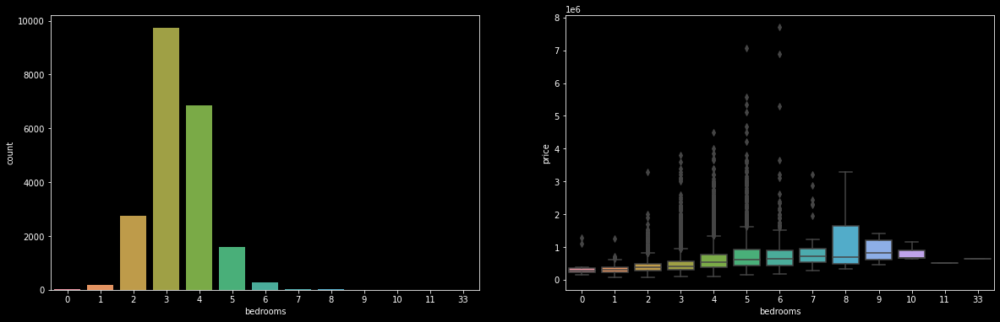

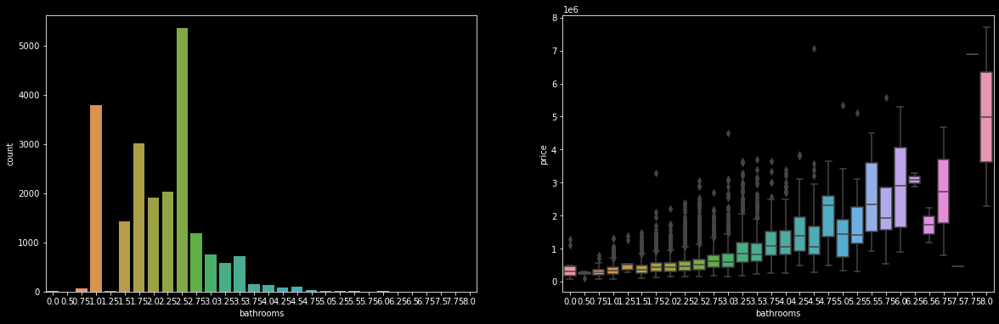

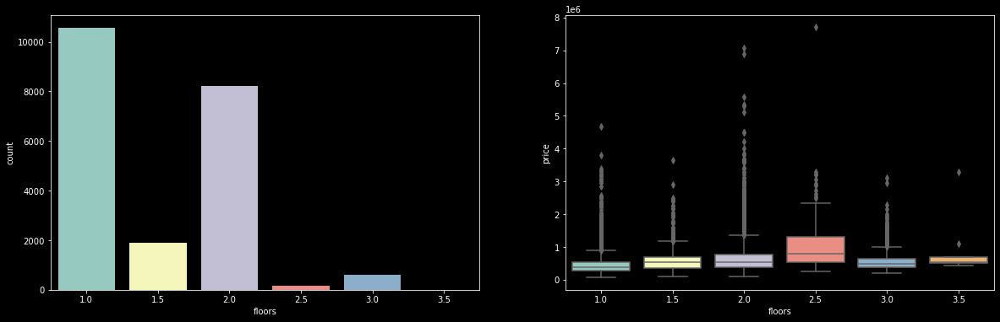

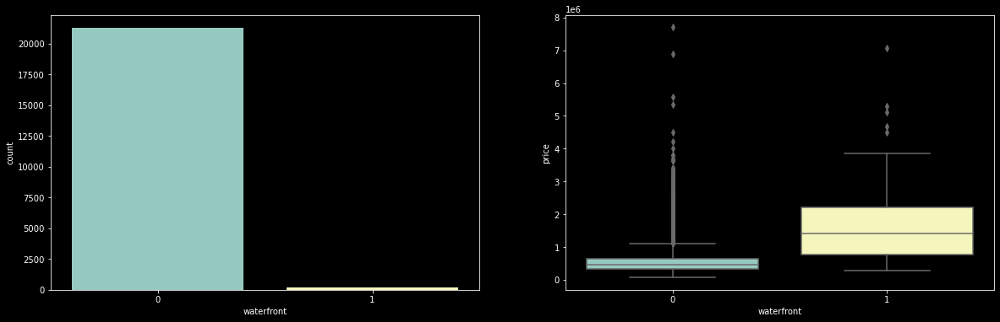

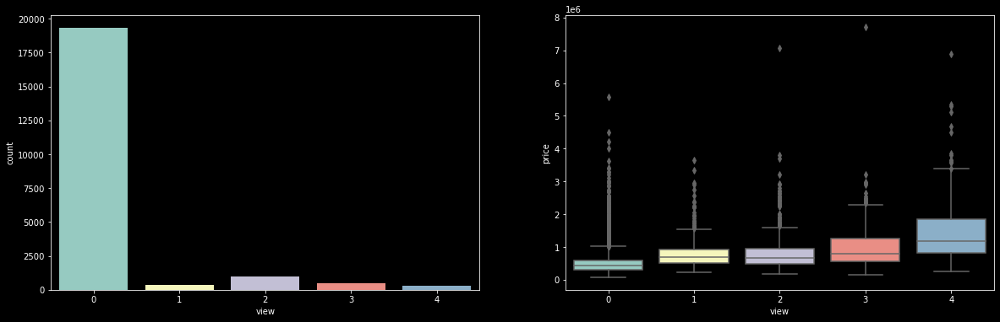

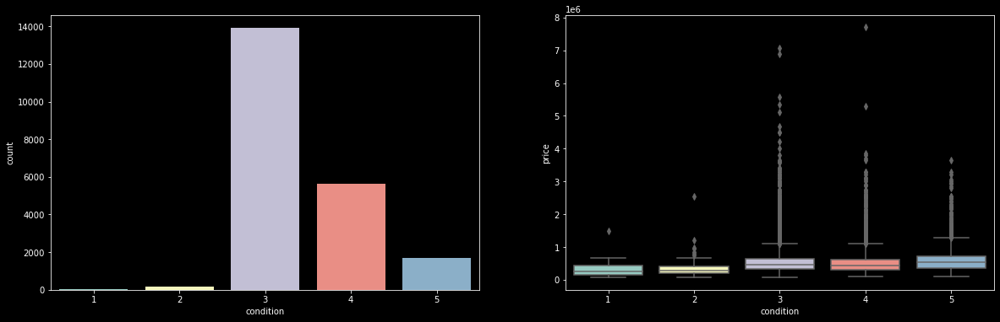

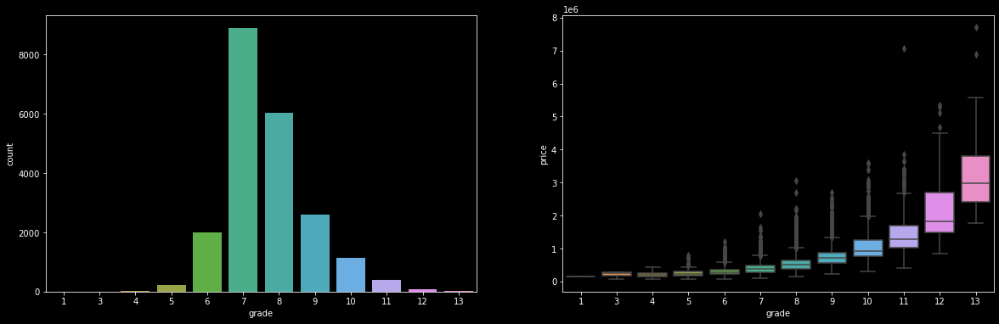

In [12]:
# analysing categorical features
categorical_features = ['bedrooms', 'bathrooms','floors', 'waterfront', 'view', 'condition', 'grade']

for feature in categorical_features:
    categorial_feature_overview(df=data, feature=feature)

The categorical variables that most positively impact the price are: bedrooms, bathrooms and grade. </br>
Houses with 3 or more floors have a negative impact on price.

There are some houses with too many bedroom. Let's analyze it.

In [13]:
print(data['bedrooms'].sort_values().unique())

data[data['bedrooms']>=9][['bedrooms', 'bathrooms','sqft_living','sqft_above']]

[ 0  1  2  3  4  5  6  7  8  9 10 11 33]


,bedrooms,bathrooms,sqft_living,sqft_above
6079,9,4.50,3650,2530
18443,9,3.00,2820,1880
16844,9,4.00,4620,3870
19254,10,3.00,2920,1860
15161,10,2.00,3610,3010
4235,9,3.00,3680,2830
15870,33,1.75,1620,1040
4096,9,4.50,3830,2450
8757,11,3.00,3000,2400
13314,10,5.25,4590,2500


In [14]:
data[data['bedrooms']==33]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_med
15870,2402100895,2014-06-25,640000.0,33,1.75,1620,6000,1.0,0,0,...,1040,580,1947,0,98103,47.6878,-122.331,1330,4700,Above Median


There is one houses with 33 bedrooms, with internal area below the median and less than 2 bathrooms, which makes no sense. We can assume that there is a typo in '33'. Since this is an outlier that impacts data spread, we will replace with the median value of bedrooms.

In [15]:
#replace 33-bedrooms data with median value
data.loc[data['bedrooms'] == 33, 'bedrooms'] = data['bedrooms'].median()

#check again to see if it is gone
data[data['bedrooms'] == 33]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_med


### Numerical features

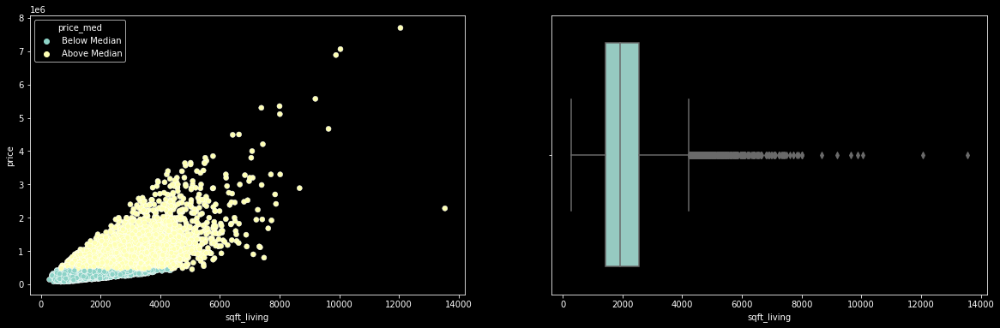

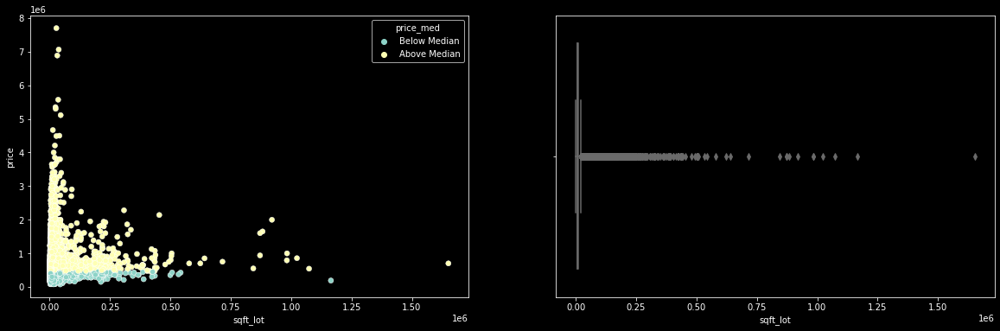

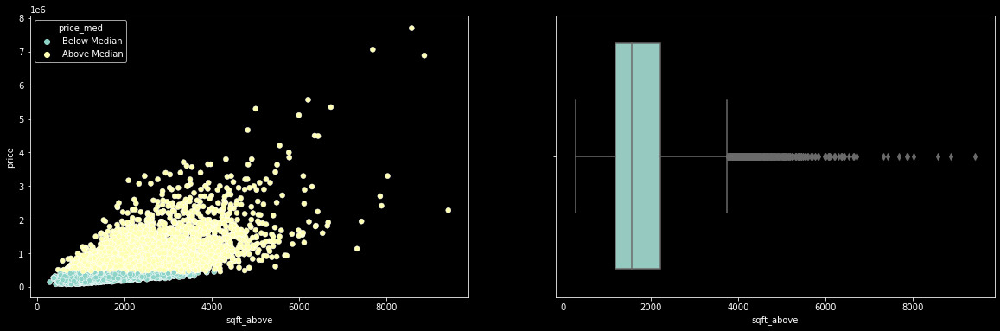

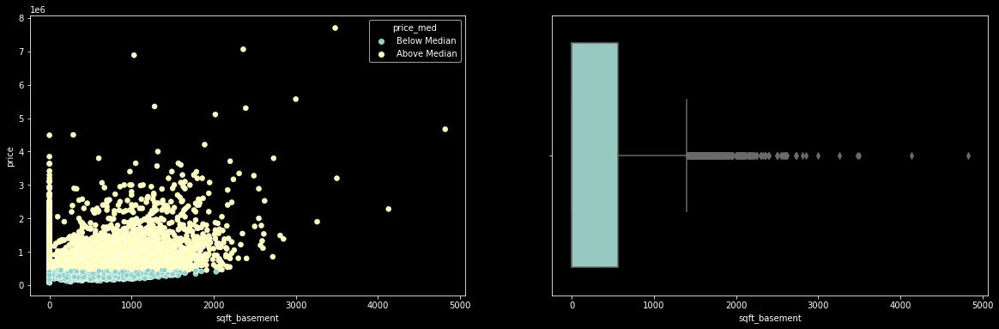

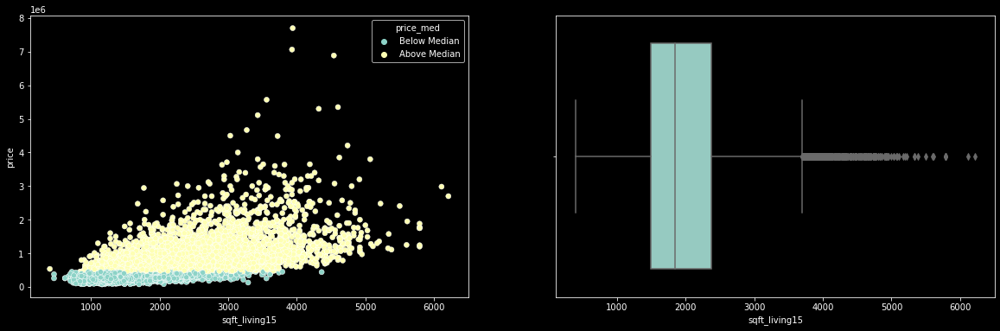

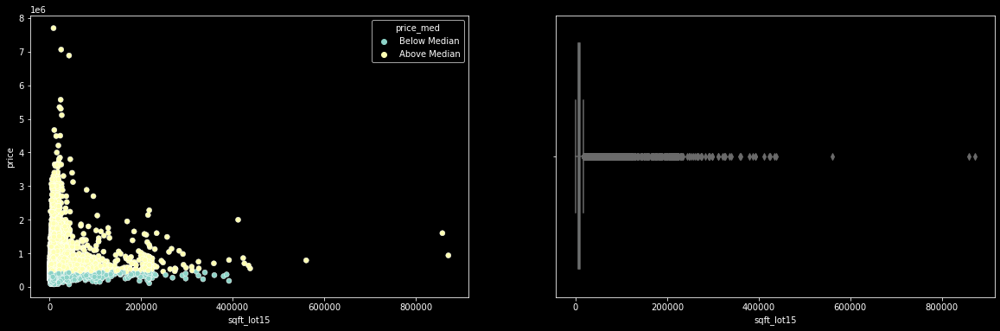

In [16]:
# analysing numerical features
numerical_features = ['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']

for feature in numerical_features:
    numerical_feature_overview(df=data, feature=feature)

The numerical variables that most positively impact the price are: sqft_living', 'sqft_above' and 'sqft_living15'. </br>
This demonstrates that size area and neighborhood/location is a value-adding feature when predicting the price of a home.

### Numerical features x Categorial features

Let`s analyse the numerical and categorial features that that seem to have a more positive impact on the price.

In [17]:
def cat_num_feature_overview(df, cat_feature):
    plt.figure(figsize = (15, 15))
    sns.lmplot(x = cat_feature, y = 'sqft_living', hue = 'price_med', data = df, fit_reg = True, palette = 'Spectral', markers = '.', aspect = 3)
    sns.lmplot(x = cat_feature, y = 'sqft_above', hue = 'price_med', data = df, fit_reg = True, palette = 'Spectral', markers = '.', aspect = 3)
    plt.show()

<Figure size 1080x1080 with 0 Axes>

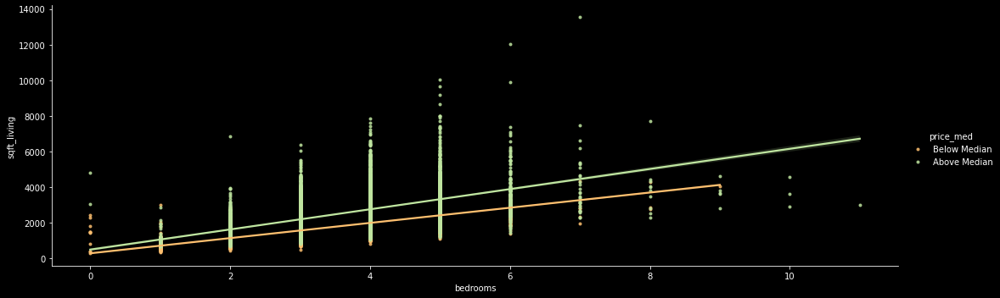

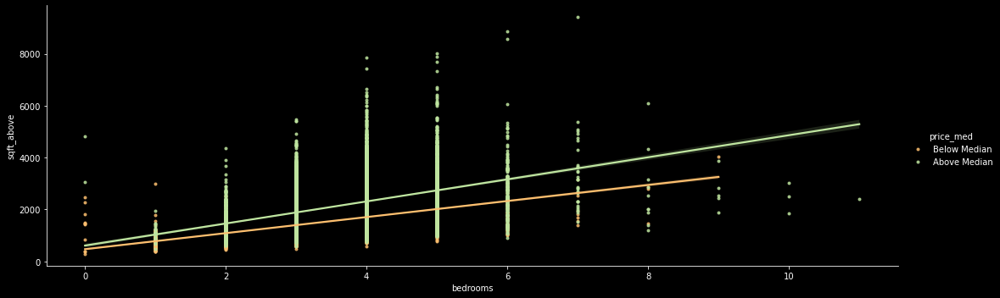

<Figure size 1080x1080 with 0 Axes>

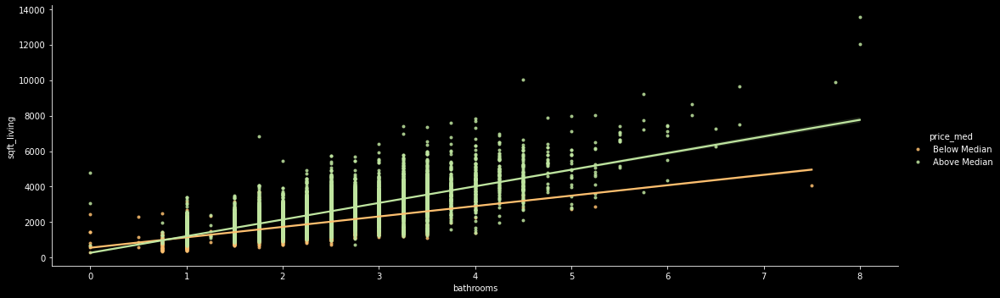

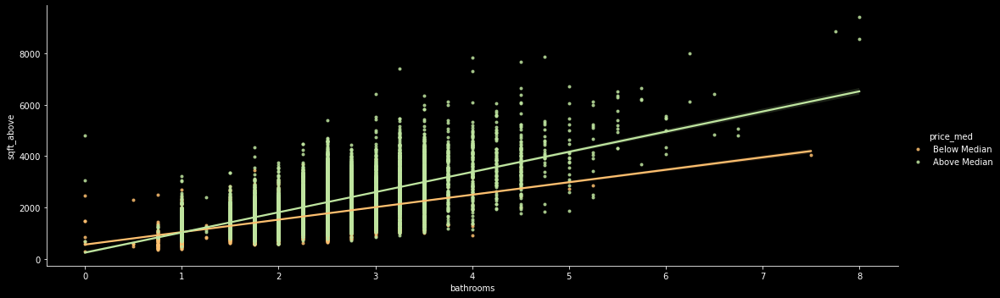

<Figure size 1080x1080 with 0 Axes>

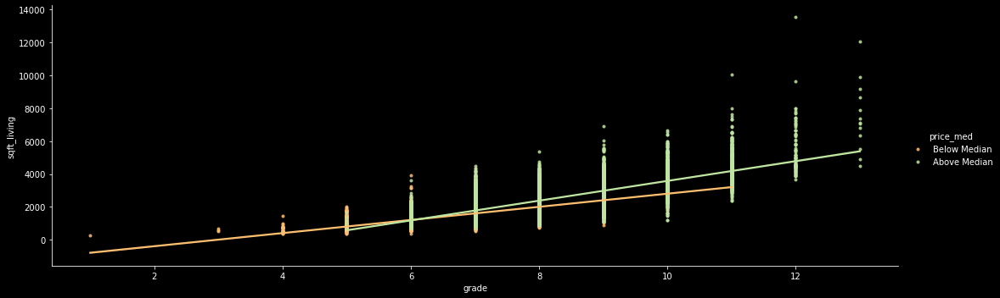

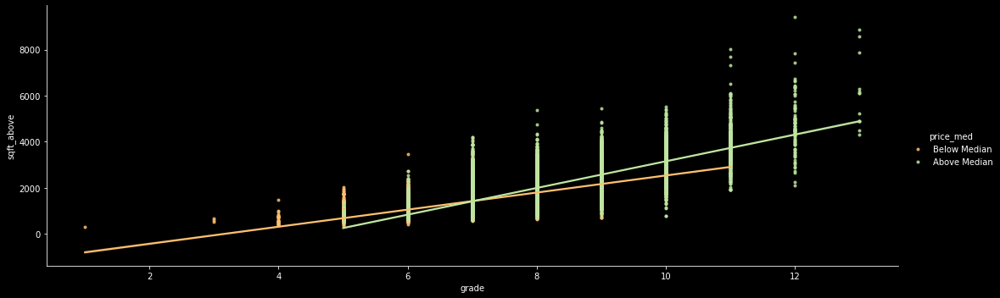

In [18]:
lst_cat_feature = ['bedrooms', 'bathrooms', 'grade']

for feature in lst_cat_feature:
    cat_num_feature_overview(df=data, cat_feature=feature)


The main conclusions after analyzing the charts are: </br>
- Small houses with many bedrooms and/or bathrooms, loses purchase value
- Houses must have at least one bathroom to add value
- The higher the square footage, the higher the grade
- Small houses must have at least grade equals to 7
- Houses with a grade equals to 11 or more are above average
 

## Answering the Questions

### Which houses should House Rocket buy and at what purchase price?


Houses requirements:
- floors < 3
- grades >= 7
- 0-2000 sqft of living space: 1-2 bedrooms and 1-2 bathrooms 
- 2.000-5.0000 sqft of living space: 3-5 bedrooms | 3-5 bathrooms 
- more than 5.0000 sqft of living space: at least 6 bedrooms and 6 bathrooms

In [19]:
data['living_size'] = data['sqft_living'].apply(lambda x: 'small' if x<=2000 else 'medium' if x<=5000 else 'large')
data['num_bedroom'] = data['bedrooms'].apply(lambda x: 'small' if x<=2 else 'medium' if x<=5 else 'large')
data['num_bathroom'] = data['bathrooms'].apply(lambda x: 'small' if x<=2 else 'medium' if x<=5 else 'large')

data['buy_house'] = 'No'
data['buy_house'] = np.where( (data['living_size'] == data['num_bedroom']) &
                              (data['living_size'] == data['num_bathroom']) &
                              (data['floors'] < 3 ) &
                              (data['grade'] >= 7 ), "Yes", "No")

In [20]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,price_med,living_size,num_bedroom,num_bathroom,buy_house
15951,9900000190,2014-10-30,268950.0,3,1.00,1320,8100,1.0,0,0,...,98166,47.4697,-122.351,1000,8100,Below Median,small,medium,small,No
20979,9895000040,2014-07-03,399900.0,2,1.75,1410,1005,1.5,0,0,...,98027,47.5446,-122.018,1440,1188,Below Median,small,small,small,Yes
7621,9842300540,2014-06-24,339000.0,3,1.00,1100,4128,1.0,0,0,...,98126,47.5296,-122.379,1510,4538,Below Median,small,medium,small,No
3260,9842300485,2015-03-11,380000.0,2,1.00,1040,7372,1.0,0,0,...,98126,47.5285,-122.378,1930,5150,Below Median,small,small,small,Yes
16737,9842300095,2014-07-25,365000.0,5,2.00,1600,4168,1.5,0,0,...,98126,47.5297,-122.381,1190,4168,Below Median,small,medium,small,No


### Once the house is purchased, what would the sale price be?

As we saw, location also impacts the price. Let's group the houses by zipcode and size living and calculate the average price.</br>
- If purchase price is higher than region median price + living size price, sales price will be equal to the price purchase + 10%
- If purchase price is lower than region median price + living size price, sales price will be equal to the price purchase + 30%

In [21]:
# median price per region
data_med_price = data.groupby(['zipcode', 'living_size'])['price'].median().reset_index()
data_med_price.rename(columns = {'price': 'price_med_region_size'}, inplace = True)

data = pd.merge(data, data_med_price, how='inner', on=['zipcode', 'living_size'])
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,lat,long,sqft_living15,sqft_lot15,price_med,living_size,num_bedroom,num_bathroom,buy_house,price_med_region_size
0,9900000190,2014-10-30,268950.0,3,1.00,1320,8100,1.0,0,0,...,47.4697,-122.351,1000,8100,Below Median,small,medium,small,No,305000.0
1,9334800140,2014-10-23,315000.0,3,1.75,1660,8160,1.0,0,0,...,47.4608,-122.358,1490,8100,Below Median,small,medium,small,No,305000.0
2,8096000060,2015-04-13,655000.0,2,1.75,1450,15798,2.0,1,4,...,47.4497,-122.375,2030,13193,Above Median,small,small,small,Yes,305000.0
3,7635801032,2014-07-10,410000.0,3,1.00,1470,6500,1.0,0,0,...,47.4730,-122.362,1470,9300,Below Median,small,medium,small,No,305000.0
4,7635800313,2014-07-18,300000.0,4,1.50,1460,8760,1.0,0,0,...,47.4698,-122.360,1610,9375,Below Median,small,medium,small,No,305000.0


In [22]:
data['price_sale']=0
data['price_sale'] = np.where( (data['buy_house'] == "Yes") & (data['price'] <= data['price_med_region_size']), data['price']*1.1, data['price']*1.3)
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,long,sqft_living15,sqft_lot15,price_med,living_size,num_bedroom,num_bathroom,buy_house,price_med_region_size,price_sale
0,9900000190,2014-10-30,268950.0,3,1.00,1320,8100,1.0,0,0,...,-122.351,1000,8100,Below Median,small,medium,small,No,305000.0,349635.0
1,9334800140,2014-10-23,315000.0,3,1.75,1660,8160,1.0,0,0,...,-122.358,1490,8100,Below Median,small,medium,small,No,305000.0,409500.0
2,8096000060,2015-04-13,655000.0,2,1.75,1450,15798,2.0,1,4,...,-122.375,2030,13193,Above Median,small,small,small,Yes,305000.0,851500.0
3,7635801032,2014-07-10,410000.0,3,1.00,1470,6500,1.0,0,0,...,-122.362,1470,9300,Below Median,small,medium,small,No,305000.0,533000.0
4,7635800313,2014-07-18,300000.0,4,1.50,1460,8760,1.0,0,0,...,-122.360,1610,9375,Below Median,small,medium,small,No,305000.0,390000.0


Expected profit calculation

In [23]:
data['profit'] = 0
data['profit'] = np.where( data['buy_house'] == "Yes", data['price_sale'] - data['price'], 0)
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_living15,sqft_lot15,price_med,living_size,num_bedroom,num_bathroom,buy_house,price_med_region_size,price_sale,profit
0,9900000190,2014-10-30,268950.0,3,1.00,1320,8100,1.0,0,0,...,1000,8100,Below Median,small,medium,small,No,305000.0,349635.0,0.0
1,9334800140,2014-10-23,315000.0,3,1.75,1660,8160,1.0,0,0,...,1490,8100,Below Median,small,medium,small,No,305000.0,409500.0,0.0
2,8096000060,2015-04-13,655000.0,2,1.75,1450,15798,2.0,1,4,...,2030,13193,Above Median,small,small,small,Yes,305000.0,851500.0,196500.0
3,7635801032,2014-07-10,410000.0,3,1.00,1470,6500,1.0,0,0,...,1470,9300,Below Median,small,medium,small,No,305000.0,533000.0,0.0
4,7635800313,2014-07-18,300000.0,4,1.50,1460,8760,1.0,0,0,...,1610,9375,Below Median,small,medium,small,No,305000.0,390000.0,0.0


In [24]:
total_profit = data['profit'].sum()

print('Total Profit: ${:,.0f}\n' .format(total_profit))

print('Top 10 Average Profit by Region:\n')

data[data['buy_house']=='Yes'].groupby('zipcode')['profit'].mean().reset_index().sort_values(by='profit', ascending=False)[:10]

Total Profit: $1,363,137,815

Top 10 Average Profit by Region:



,zipcode,profit
24,98039,449384.656250
3,98004,358377.822674
48,98112,299498.306618
25,98040,290464.128796
41,98102,281638.435897
43,98105,253245.927957
69,98199,236536.495070
21,98033,234178.727232
47,98109,221699.941860
4,98005,212596.953061


### Data Visualization

In [25]:
# map
fig = px.scatter_mapbox( data, 
                        title = 'Houses that House Rocket should buy or not',
                         lat="lat", 
                         lon="long", 
                         color ='buy_house',
                         color_discrete_map={
                                        'Yes': 'blue', 'No': 'red'},
                         center={"lat": data['lat'].mean(), 
                                 "lon": data['long'].mean()},
                         hover_name='id', 
                         hover_data = {'zipcode':True,
                                       'profit': True,
                                       'price_sale':True,
                                       'price': True,
                                       'bedrooms':True,
                                       'bathrooms':True,
                                       'sqft_living':True,
                                       'sqft_above':True,
                                       'grade': True,
                                       'floors':True,
                                       'buy_house': False,
                                       'lat':False,
                                       'long':False},
                         zoom=9,
                         )

fig.update_layout(mapbox_style="carto-positron",
                  height=600, 
                  width = 1000,
                  margin={"r":0,"t":40,"l":0,"b":0},
                 title_x=0.02,
                 title_y=0.98
                 )
fig.show()

In [26]:
total_houses = data['id'].count()
buy_houses = data[data['buy_house'] == 'Yes']['id'].count()
buy_houses_perc = buy_houses/total_houses

print('Out of a total of {} houses, {} are recommended for purchase, which represents a share of {:.0%}.' .format(total_houses, buy_houses, buy_houses_perc))

Out of a total of 21436 houses, 8889 are recommended for purchase, which represents a share of 41%.


In [27]:
# filter just the houses that should be bought
df = data[data['buy_house'] == 'Yes']

fig = px.scatter_mapbox( df, 
                         title = 'Houses that House Rocket should buy per expected profit',
                         lat="lat", 
                         lon="long", 
                         color ='profit',
                         size = 'profit', 
                         center={"lat": df['lat'].mean(), 
                                 "lon": df['long'].mean()},
                         hover_name='id', 
                         hover_data = {'zipcode':True,
                                       'profit': True,
                                       'price_sale':True,
                                       'price': True,
                                       'bedrooms':True,
                                       'bathrooms':True,
                                       'sqft_living':True,
                                       'sqft_above':True,
                                       'grade': True,
                                       'floors':True,
                                       'buy_house': False,
                                       'lat':False,
                                       'long':False},
                         zoom=9
                         )

fig.update_layout(mapbox_style="carto-positron",
                  height=600, 
                  width = 1000,
                  margin={"r":0,"t":40,"l":0,"b":0},
                  title_x=0.02,
                  title_y=0.98
                 )
fig.show()

In [28]:
def plot_pareto_by_mean(df_, group_by, column):

    df = df_.groupby(group_by)[column].mean().reset_index()
    df = df.sort_values(by=column,ascending=False)
    df[group_by] = df[group_by].astype(str)
    df.index = df[group_by].to_list()

    df["cumpercentage"] = df[column].cumsum()/df[column].sum()*100

    fig, ax = plt.subplots(figsize=(50,10))
    ax.bar(df.index, df[column], color="C0")
    ax2 = ax.twinx()
    ax2.plot(df.index, df["cumpercentage"], color="C1", marker="D", ms=7)
    ax2.yaxis.set_major_formatter(PercentFormatter())

    ax.tick_params(axis="y", colors="C0")
    ax2.tick_params(axis="y", colors="C1")
    ax2.axhline(80, color='red', linestyle='dashed')

    for tick in ax.get_xticklabels():
        tick.set_rotation(45)
    
    plt.title('Average Profit by Region', size=25)
    plt.show()
    
    
def plot_pareto_by_sum(df_, group_by, column):

    df = df_.groupby(group_by)[column].sum().reset_index()
    df = df.sort_values(by=column,ascending=False)
    df[group_by] = df[group_by].astype(str)
    df.index = df[group_by].to_list()

    df["cumpercentage"] = df[column].cumsum()/df[column].sum()*100

    fig, ax = plt.subplots(figsize=(50,10))
    ax.bar(df.index, df[column], color="C0")
    ax.set_ylim(0, 3000000)
    ax2 = ax.twinx()
    ax2.plot(df.index, df["cumpercentage"], color="C1", marker="D", ms=7)
    ax2.yaxis.set_major_formatter(PercentFormatter())

    ax.tick_params(axis="y", colors="C0")
    ax2.tick_params(axis="y", colors="C1")
    ax2.axhline(80, color='red', linestyle='dashed')

    for tick in ax.get_xticklabels():
        tick.set_rotation(45)
        
    plt.title('Total Profit by House', size=25)    
    plt.show()


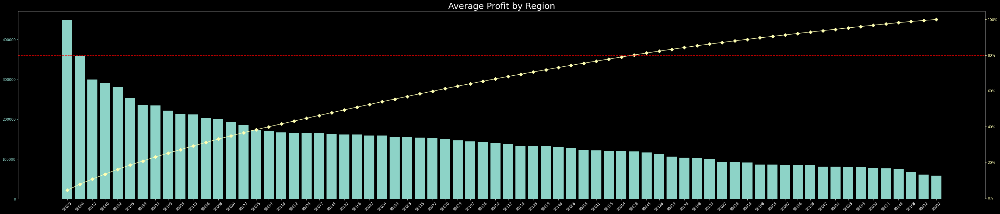

In [29]:
df = data[data['buy_house']=='Yes']
plot_pareto_by_mean(df, 'zipcode', 'profit')

The graph shows the zip codes that will return the highest expected profit on average. </br>
Let's look at the top 3 zip codes in more detail to identify which would be the best homes to invest in.

zipcode: 98039


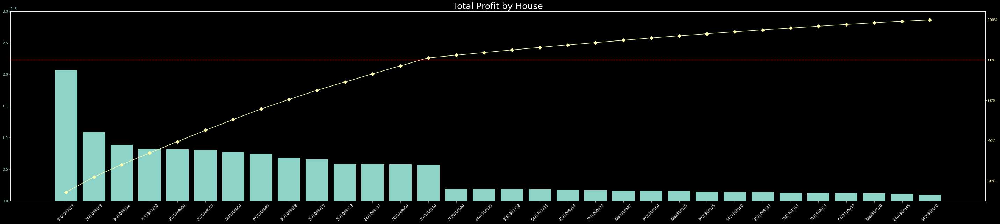

zipcode: 98004


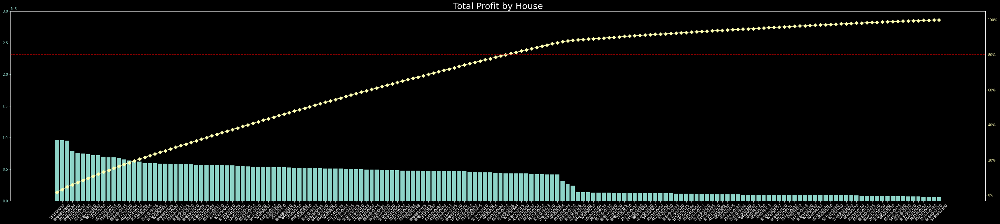

zipcode: 98112


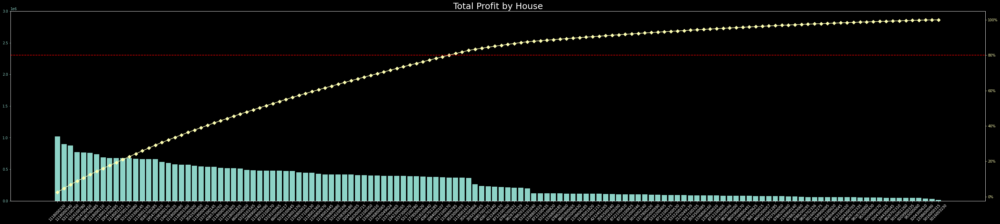

In [30]:
temp = df.groupby('zipcode')['profit'].mean().reset_index().sort_values(by='profit', ascending=False)
top3_zipcode = temp['zipcode'][:3].to_list()

for zip in top3_zipcode:
    dff = data[data['buy_house'] == 'Yes']
    dff = dff[dff['zipcode']==zip]
    dff['id'] = dff['id'].astype(str)
    print('zipcode: {}'.format(zip))
    plot_pareto_by_sum(dff, 'id', 'profit')


The graphs show that investments on the first region (zip code 98039) will bring the same return with the purchase and sale of a much smaller number of houses (less than half) compared to the other regions.

## Business Results

In [31]:
total_houses = data['id'].count()
buy_houses = data[data['buy_house'] == 'Yes']['id'].count()
buy_houses_perc = buy_houses/total_houses
total_profit = data['profit'].sum()

In [32]:
print('Out of a total of {} houses, {} are recommended for purchase, which represents a share of {:.0%}.' .format(total_houses, buy_houses, buy_houses_perc))
print('Total Profit: ${:,.0f}\n' .format(total_profit))

Out of a total of 21436 houses, 8889 are recommended for purchase, which represents a share of 41%.
Total Profit: $1,363,137,815



For better visualization of the obtained results, I developed a web application using streamlit, which can be accessed through this [link](https://lz-house-rocket-app.herokuapp.com/).

## Conclusions

At the end of this project it was possible to identify the best opportunities in order to maximize the profit resulting from the purchase and sale of real estate in the King County area. The company has access to information on which properties to buy or not, the amount invested in the purchase, for what value the property should be sold and what the profit will be, qnd can easily identify which investments will bring you the greatest return.

### Next Steps

The next step is to analyze which properties should be renovated to increase the sale value. And what is the increase in the price given by each type of reform.

### References

House Sales in King County, USA. Kaggle. Available in: https://www.kaggle.com/harlfoxem/housesalesprediction

Blog "Seja Um Data Scientist". Available in: https://sejaumdatascientist.com/os-5-projetos-de-data-science-que-fara-o-recrutador-olhar-para-voce/

Comunidade DS. Available in: https://www.comunidadedatascience.com/